<a href="https://colab.research.google.com/github/Thiago-Magnago/NLP_Coronavirus_Tweets_Sentiment/blob/main/NLP_Coronavirus_Tweets_Sentiment_RandomForest.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

###Data

In [ ]:
# Install
!pip install wordcloud -q
!pip install nltk

In [ ]:
# Load libraries
import nltk
nltk.download('punkt')
import numpy as np
import pandas as pd
import re
import matplotlib.pyplot as plt
from PIL import Image
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.


In [ ]:
from nltk.tokenize import word_tokenize

In [ ]:
# Load Data

# Train base
df = pd.read_csv("Corona_NLP_train.csv", encoding = "ISO-8859-1")

# Test base
df_test = pd.read_csv("Corona_NLP_test.csv", encoding = "ISO-8859-1")

###Exploratory Data Analysis

In [ ]:
df.head()

,UserName,ScreenName,Location,TweetAt,OriginalTweet,Sentiment
0,3799,48751,London,16-03-2020,@MeNyrbie @Phil_Gahan @Chrisitv https://t.co/i...,Neutral
1,3800,48752,UK,16-03-2020,advice Talk to your neighbours family to excha...,Positive
2,3801,48753,Vagabonds,16-03-2020,Coronavirus Australia: Woolworths to give elde...,Positive
3,3802,48754,NaN,16-03-2020,My food stock is not the only one which is emp...,Positive
4,3803,48755,NaN,16-03-2020,"Me, ready to go at supermarket during the #COV...",Extremely Negative


In [ ]:
df_test.head()

,UserName,ScreenName,Location,TweetAt,OriginalTweet,Sentiment
0,1,44953,NYC,02-03-2020,TRENDING: New Yorkers encounter empty supermar...,Extremely Negative
1,2,44954,"Seattle, WA",02-03-2020,When I couldn't find hand sanitizer at Fred Me...,Positive
2,3,44955,NaN,02-03-2020,Find out how you can protect yourself and love...,Extremely Positive
3,4,44956,Chicagoland,02-03-2020,#Panic buying hits #NewYork City as anxious sh...,Negative
4,5,44957,"Melbourne, Victoria",03-03-2020,#toiletpaper #dunnypaper #coronavirus #coronav...,Neutral


In [ ]:
# Eliminating columns with missing values
summary = df.dropna(subset=['OriginalTweet'], axis=0)['OriginalTweet']

In [ ]:
summary.head()

0    @MeNyrbie @Phil_Gahan @Chrisitv https://t.co/i...
1    advice Talk to your neighbours family to excha...
2    Coronavirus Australia: Woolworths to give elde...
3    My food stock is not the only one which is emp...
4    Me, ready to go at supermarket during the #COV...
Name: OriginalTweet, dtype: object

In [ ]:
# Tweet examples
display(summary.iloc[100])
display(summary.iloc[120])
display(summary.iloc[133])

'I hate grocery shopping in general but I swear IÂ\x92m doing it online next shop, can not deal with the swathes of panic buyers at all! #COVID?19 #coronavirus #coronavirusuk #anxiety #panicbuyinguk #morons'

'@AirCanada very poor customer service if you let the algorithms run the prices up in states of emergency and do not refund the cost. Also very poor staffing @Airport_FRA #COVID2019'

'? HAPPY M O N D A Y Friends ?\r\r\n-\r\r\nI know everyone is uneasy about all thats going on with the #coronavirus but lets not forget about our small business who need our support! Whether youÂ\x92re shopping online or orderingÂ\x85 https://t.co/AibxMekdro'

In [ ]:
# A commom practice on Twitter is republish.
# Checking duplicated rows.

# Number of ‘OriginalTweet’:
df.OriginalTweet.count()

41157

In [ ]:
# Dropping occasional duplicated tweets:
df.drop_duplicates(['OriginalTweet'], inplace=True)

In [ ]:
# Checking number of rows. Ok, There's no duplicated tweets!
df.OriginalTweet.count()

41157

WordCloud

In [ ]:
# Concatenate words
all_summary = " ".join(s for s in summary)

# Number of words
print("Quantidade de Palavras: {}".format(len(all_summary)))

Quantidade de Palavras: 8445422


In [ ]:
all_summary

'@MeNyrbie @Phil_Gahan @Chrisitv https://t.co/iFz9FAn2Pa and https://t.co/xX6ghGFzCC and https://t.co/I2NlzdxNo8 advice Talk to your neighbours family to exchange phone numbers create contact list with phone numbers of neighbours schools employer chemist GP set up online shopping accounts if poss adequate supplies of regular meds but not over order Coronavirus Australia: Woolworths to give elderly, disabled dedicated shopping hours amid COVID-19 outbreak https://t.co/bInCA9Vp8P My food stock is not the only one which is empty...\r\r\n\r\r\nPLEASE, don\'t panic, THERE WILL BE ENOUGH FOOD FOR EVERYONE if you do not take more than you need. \r\r\nStay calm, stay safe.\r\r\n\r\r\n#COVID19france #COVID_19 #COVID19 #coronavirus #confinement #Confinementotal #ConfinementGeneral https://t.co/zrlG0Z520j Me, ready to go at supermarket during the #COVID19 outbreak.\r\r\n\r\r\nNot because I\'m paranoid, but because my food stock is litteraly empty. The #coronavirus is a serious thing, but please, 

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


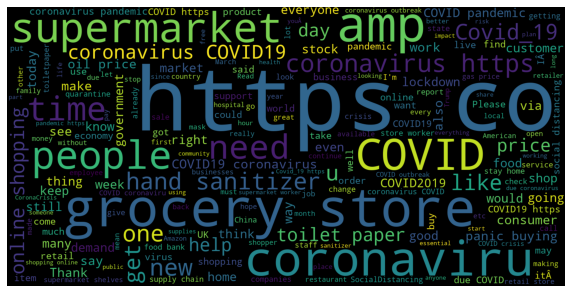

In [ ]:
# Stopword list
nltk.download('stopwords')
from nltk.corpus import stopwords

stopWords_list = list(stopwords.words('english'))

# Generating the wordcloud
wordcloud = WordCloud(stopwords=stopWords_list,
                      background_color="black",
                      width=1600, height=800).generate(all_summary)

# Plotting the final image
fig, ax = plt.subplots(figsize=(10,6))
ax.imshow(wordcloud, interpolation='bilinear')
ax.set_axis_off()

plt.imshow(wordcloud);
#wordcloud.to_file("airbnb_summary_wordcloud.png")

### Tokenization (Tests)

NLTK

In [ ]:
my_text = df['OriginalTweet']

In [ ]:
tokenization = []
for word in my_text:
  tokenization.append(word_tokenize(word))

In [ ]:
tokenization[0]

['@',
 'MeNyrbie',
 '@',
 'Phil_Gahan',
 '@',
 'Chrisitv',
 'https',
 ':',
 '//t.co/iFz9FAn2Pa',
 'and',
 'https',
 ':',
 '//t.co/xX6ghGFzCC',
 'and',
 'https',
 ':',
 '//t.co/I2NlzdxNo8']

In [ ]:
df['tokenizacao NLTK'] = tokenization

In [ ]:
df.head()

,UserName,ScreenName,Location,TweetAt,OriginalTweet,Sentiment,tokenizacao NLTK
0,3799,48751,London,16-03-2020,@MeNyrbie @Phil_Gahan @Chrisitv https://t.co/i...,Neutral,"[@, MeNyrbie, @, Phil_Gahan, @, Chrisitv, http..."
1,3800,48752,UK,16-03-2020,advice Talk to your neighbours family to excha...,Positive,"[advice, Talk, to, your, neighbours, family, t..."
2,3801,48753,Vagabonds,16-03-2020,Coronavirus Australia: Woolworths to give elde...,Positive,"[Coronavirus, Australia, :, Woolworths, to, gi..."
3,3802,48754,NaN,16-03-2020,My food stock is not the only one which is emp...,Positive,"[My, food, stock, is, not, the, only, one, whi..."
4,3803,48755,NaN,16-03-2020,"Me, ready to go at supermarket during the #COV...",Extremely Negative,"[Me, ,, ready, to, go, at, supermarket, during..."


NLTK TweetTokenizer

In [ ]:
my_text2 = df['OriginalTweet']

In [ ]:
#A biblioteca nos fornece um pacote específico para a tokenização de tweets.

from nltk.tokenize import TweetTokenizer
tweet_tokenizer = TweetTokenizer() 
#tweet_tokenizer.tokenize(frase)

In [ ]:
tokenization2 = []
for word in my_text2:
  tokenization2.append(tweet_tokenizer.tokenize(word))

In [ ]:
tokenization2[0]

['@MeNyrbie',
 '@Phil_Gahan',
 '@Chrisitv',
 'https://t.co/iFz9FAn2Pa',
 'and',
 'https://t.co/xX6ghGFzCC',
 'and',
 'https://t.co/I2NlzdxNo8']

In [ ]:
df['tokenizacao NLTK Tweet'] = tokenization2
df.head()

,UserName,ScreenName,Location,TweetAt,OriginalTweet,Sentiment,tokenizacao NLTK,tokenizacao NLTK Tweet
0,3799,48751,London,16-03-2020,@MeNyrbie @Phil_Gahan @Chrisitv https://t.co/i...,Neutral,"[@, MeNyrbie, @, Phil_Gahan, @, Chrisitv, http...","[@MeNyrbie, @Phil_Gahan, @Chrisitv, https://t...."
1,3800,48752,UK,16-03-2020,advice Talk to your neighbours family to excha...,Positive,"[advice, Talk, to, your, neighbours, family, t...","[advice, Talk, to, your, neighbours, family, t..."
2,3801,48753,Vagabonds,16-03-2020,Coronavirus Australia: Woolworths to give elde...,Positive,"[Coronavirus, Australia, :, Woolworths, to, gi...","[Coronavirus, Australia, :, Woolworths, to, gi..."
3,3802,48754,NaN,16-03-2020,My food stock is not the only one which is emp...,Positive,"[My, food, stock, is, not, the, only, one, whi...","[My, food, stock, is, not, the, only, one, whi..."
4,3803,48755,NaN,16-03-2020,"Me, ready to go at supermarket during the #COV...",Extremely Negative,"[Me, ,, ready, to, go, at, supermarket, during...","[Me, ,, ready, to, go, at, supermarket, during..."


KERAS

In [ ]:
from keras.preprocessing.text import text_to_word_sequence

In [ ]:
my_text3 = df['OriginalTweet']

In [ ]:
tokenization3 = []
for word in my_text3:
  tokenization3.append(text_to_word_sequence(word))

In [ ]:
tokenization3[0]

['menyrbie',
 'phil',
 'gahan',
 'chrisitv',
 'https',
 't',
 'co',
 'ifz9fan2pa',
 'and',
 'https',
 't',
 'co',
 'xx6ghgfzcc',
 'and',
 'https',
 't',
 'co',
 'i2nlzdxno8']

In [ ]:
df['tokenizacao KERAS'] = tokenization3
df.head()

,UserName,ScreenName,Location,TweetAt,OriginalTweet,Sentiment,tokenizacao NLTK,tokenizacao NLTK Tweet,tokenizacao KERAS
0,3799,48751,London,16-03-2020,@MeNyrbie @Phil_Gahan @Chrisitv https://t.co/i...,Neutral,"[@, MeNyrbie, @, Phil_Gahan, @, Chrisitv, http...","[@MeNyrbie, @Phil_Gahan, @Chrisitv, https://t....","[menyrbie, phil, gahan, chrisitv, https, t, co..."
1,3800,48752,UK,16-03-2020,advice Talk to your neighbours family to excha...,Positive,"[advice, Talk, to, your, neighbours, family, t...","[advice, Talk, to, your, neighbours, family, t...","[advice, talk, to, your, neighbours, family, t..."
2,3801,48753,Vagabonds,16-03-2020,Coronavirus Australia: Woolworths to give elde...,Positive,"[Coronavirus, Australia, :, Woolworths, to, gi...","[Coronavirus, Australia, :, Woolworths, to, gi...","[coronavirus, australia, woolworths, to, give,..."
3,3802,48754,NaN,16-03-2020,My food stock is not the only one which is emp...,Positive,"[My, food, stock, is, not, the, only, one, whi...","[My, food, stock, is, not, the, only, one, whi...","[my, food, stock, is, not, the, only, one, whi..."
4,3803,48755,NaN,16-03-2020,"Me, ready to go at supermarket during the #COV...",Extremely Negative,"[Me, ,, ready, to, go, at, supermarket, during...","[Me, ,, ready, to, go, at, supermarket, during...","[me, ready, to, go, at, supermarket, during, t..."


NLTK Tweeter + StopWords

In [ ]:
nltk.download('stopwords')
from nltk.corpus import stopwords

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


In [ ]:
stopWords_list = list(stopwords.words('english'))

In [ ]:
stopWords_list[0:10]

['i', 'me', 'my', 'myself', 'we', 'our', 'ours', 'ourselves', 'you', "you're"]

In [ ]:
clean_words = []
for i in tokenization2:
  x = [word for word in i if not (word in stopWords_list)]
  clean_words.append(x)

In [ ]:
df['stopwords NLTK'] = clean_words

In [ ]:
df.head()

,UserName,ScreenName,Location,TweetAt,OriginalTweet,Sentiment,tokenizacao NLTK,tokenizacao NLTK Tweet,tokenizacao KERAS,stopwords NLTK
0,3799,48751,London,16-03-2020,@MeNyrbie @Phil_Gahan @Chrisitv https://t.co/i...,Neutral,"[@, MeNyrbie, @, Phil_Gahan, @, Chrisitv, http...","[@MeNyrbie, @Phil_Gahan, @Chrisitv, https://t....","[menyrbie, phil, gahan, chrisitv, https, t, co...","[@MeNyrbie, @Phil_Gahan, @Chrisitv, https://t...."
1,3800,48752,UK,16-03-2020,advice Talk to your neighbours family to excha...,Positive,"[advice, Talk, to, your, neighbours, family, t...","[advice, Talk, to, your, neighbours, family, t...","[advice, talk, to, your, neighbours, family, t...","[advice, Talk, neighbours, family, exchange, p..."
2,3801,48753,Vagabonds,16-03-2020,Coronavirus Australia: Woolworths to give elde...,Positive,"[Coronavirus, Australia, :, Woolworths, to, gi...","[Coronavirus, Australia, :, Woolworths, to, gi...","[coronavirus, australia, woolworths, to, give,...","[Coronavirus, Australia, :, Woolworths, give, ..."
3,3802,48754,NaN,16-03-2020,My food stock is not the only one which is emp...,Positive,"[My, food, stock, is, not, the, only, one, whi...","[My, food, stock, is, not, the, only, one, whi...","[my, food, stock, is, not, the, only, one, whi...","[My, food, stock, one, empty, ..., PLEASE, ,, ..."
4,3803,48755,NaN,16-03-2020,"Me, ready to go at supermarket during the #COV...",Extremely Negative,"[Me, ,, ready, to, go, at, supermarket, during...","[Me, ,, ready, to, go, at, supermarket, during...","[me, ready, to, go, at, supermarket, during, t...","[Me, ,, ready, go, supermarket, #COVID19, outb..."


In [ ]:
df.tail()

,UserName,ScreenName,Location,TweetAt,OriginalTweet,Sentiment,tokenizacao NLTK,tokenizacao NLTK Tweet,tokenizacao KERAS,stopwords NLTK
41152,44951,89903,"Wellington City, New Zealand",14-04-2020,Airline pilots offering to stock supermarket s...,Neutral,"[Airline, pilots, offering, to, stock, superma...","[Airline, pilots, offering, to, stock, superma...","[airline, pilots, offering, to, stock, superma...","[Airline, pilots, offering, stock, supermarket..."
41153,44952,89904,NaN,14-04-2020,Response to complaint not provided citing COVI...,Extremely Negative,"[Response, to, complaint, not, provided, citin...","[Response, to, complaint, not, provided, citin...","[response, to, complaint, not, provided, citin...","[Response, complaint, provided, citing, COVID,..."
41154,44953,89905,NaN,14-04-2020,You know itÂs getting tough when @KameronWild...,Positive,"[You, know, itÂs, getting, tough, when, @, Ka...","[You, know, itÂ, , s, getting, tough, when, @...","[you, know, itâs, getting, tough, when, kamer...","[You, know, itÂ, , getting, tough, @KameronWi..."
41155,44954,89906,NaN,14-04-2020,Is it wrong that the smell of hand sanitizer i...,Neutral,"[Is, it, wrong, that, the, smell, of, hand, sa...","[Is, it, wrong, that, the, smell, of, hand, sa...","[is, it, wrong, that, the, smell, of, hand, sa...","[Is, wrong, smell, hand, sanitizer, starting, ..."
41156,44955,89907,i love you so much || he/him,14-04-2020,@TartiiCat Well new/used Rift S are going for ...,Negative,"[@, TartiiCat, Well, new/used, Rift, S, are, g...","[@TartiiCat, Well, new, /, used, Rift, S, are,...","[tartiicat, well, new, used, rift, s, are, goi...","[@TartiiCat, Well, new, /, used, Rift, S, goin..."


In [ ]:
clean_words2 = []
for i in clean_words:
  for word in i:
    clean_words2.append(word)

In [ ]:
len(clean_words2)

995580

In [ ]:
from collections import Counter

# Convert the list in a counting values dictionary

word_counts_clean = Counter(clean_words2)
a = word_counts_clean

In [ ]:
a

Counter({'@MeNyrbie': 1,
         '@Phil_Gahan': 1,
         '@Chrisitv': 3,
         'https://t.co/iFz9FAn2Pa': 1,
         'https://t.co/xX6ghGFzCC': 1,
         'https://t.co/I2NlzdxNo8': 1,
         'advice': 233,
         'Talk': 15,
         'neighbours': 38,
         'family': 503,
         'exchange': 23,
         'phone': 140,
         'numbers': 100,
         'create': 112,
         'contact': 273,
         'list': 342,
         'schools': 88,
         'employer': 21,
         'chemist': 22,
         'GP': 15,
         'set': 267,
         'online': 2898,
         'shopping': 3078,
         'accounts': 42,
         'poss': 1,
         'adequate': 26,
         'supplies': 767,
         'regular': 113,
         'meds': 29,
         'order': 548,
         'Coronavirus': 816,
         'Australia': 127,
         ':': 6247,
         'Woolworths': 17,
         'give': 386,
         'elderly': 413,
         ',': 28642,
         'disabled': 75,
         'dedicated': 59,
         'hour

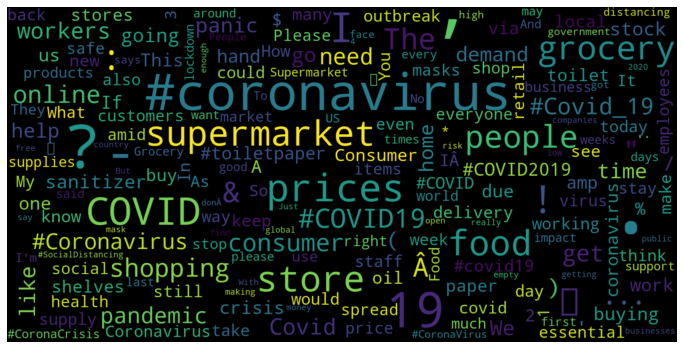

In [ ]:
#text = clean_words2
wordcloud = WordCloud(width=1600, height=800, max_font_size=200).fit_words(a)
#wordcloud = WordCloud(width=1600, height=800, max_font_size=200).generate(text)
plt.figure(figsize=(12,10))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

###Labels Compilation

In [ ]:
# Labels
df['Sentiment'].value_counts()

Positive              11422
Negative               9917
Neutral                7713
Extremely Positive     6624
Extremely Negative     5481
Name: Sentiment, dtype: int64

In [ ]:
df_test['Sentiment'].value_counts()

Negative              1041
Positive               947
Neutral                619
Extremely Positive     599
Extremely Negative     592
Name: Sentiment, dtype: int64

In [ ]:
# Checking missing values
print(df.isnull().any())
print(df_test.isnull().any())

UserName         False
ScreenName       False
Location          True
TweetAt          False
OriginalTweet    False
Sentiment        False
dtype: bool
UserName         False
ScreenName       False
Location          True
TweetAt          False
OriginalTweet    False
Sentiment        False
dtype: bool


In [ ]:
# Compiling labels from 5 to 3. 
# New labels: Negative, Positive, Neutral.
conditionlist = [
    (df['Sentiment'] == 'Negative'),
    (df['Sentiment'] == 'Extremely Negative'),
    (df['Sentiment'] == 'Positive'),
    (df['Sentiment'] == 'Extremely Positive'),
    (df['Sentiment'] == 'Neutral')
    ]
choicelist = ['Negative', 'Negative', 'Positive', 'Positive', 'Neutral']
df['NewSentiment'] = np.select(conditionlist, choicelist, default='Not Specified')

df.head()

,UserName,ScreenName,Location,TweetAt,OriginalTweet,Sentiment,NewSentiment
0,3799,48751,London,16-03-2020,@MeNyrbie @Phil_Gahan @Chrisitv https://t.co/i...,Neutral,Neutral
1,3800,48752,UK,16-03-2020,advice Talk to your neighbours family to excha...,Positive,Positive
2,3801,48753,Vagabonds,16-03-2020,Coronavirus Australia: Woolworths to give elde...,Positive,Positive
3,3802,48754,NaN,16-03-2020,My food stock is not the only one which is emp...,Positive,Positive
4,3803,48755,NaN,16-03-2020,"Me, ready to go at supermarket during the #COV...",Extremely Negative,Negative


In [ ]:
# Applying compilation of labels on test base too. 
# New labels: Negative, Positive, Neutral.

conditionlist = [
    (df_test['Sentiment'] == 'Negative'),
    (df_test['Sentiment'] == 'Extremely Negative'),
    (df_test['Sentiment'] == 'Positive'),
    (df_test['Sentiment'] == 'Extremely Positive'),
    (df_test['Sentiment'] == 'Neutral')
    ]
choicelist = ['Negative', 'Negative', 'Positive', 'Positive', 'Neutral']
df_test['NewSentiment'] = np.select(conditionlist, choicelist, default='Not Specified')

df_test.head()

,UserName,ScreenName,Location,TweetAt,OriginalTweet,Sentiment,NewSentiment
0,1,44953,NYC,02-03-2020,TRENDING: New Yorkers encounter empty supermar...,Extremely Negative,Negative
1,2,44954,"Seattle, WA",02-03-2020,When I couldn't find hand sanitizer at Fred Me...,Positive,Positive
2,3,44955,NaN,02-03-2020,Find out how you can protect yourself and love...,Extremely Positive,Positive
3,4,44956,Chicagoland,02-03-2020,#Panic buying hits #NewYork City as anxious sh...,Negative,Negative
4,5,44957,"Melbourne, Victoria",03-03-2020,#toiletpaper #dunnypaper #coronavirus #coronav...,Neutral,Neutral


In [ ]:
# Labels after compilation
df['NewSentiment'].value_counts()

Positive    18046
Negative    15398
Neutral      7713
Name: NewSentiment, dtype: int64

In [ ]:
df_test['NewSentiment'].value_counts()

Negative    1633
Positive    1546
Neutral      619
Name: NewSentiment, dtype: int64

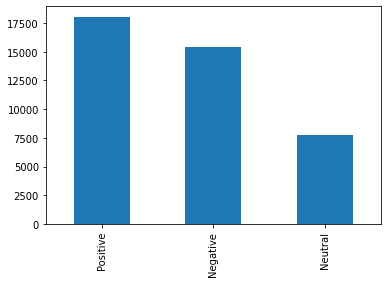

In [ ]:
# Plotting distribution of labels
df.NewSentiment.value_counts().plot(kind='bar')

###Cleaning data

In [ ]:
my_text4 = df['OriginalTweet']
my_text5 = df_test['OriginalTweet']

In [ ]:
# Function: removal of stopwords and unwanted caracters.

def Preprocessing(instancia):
    instancia = re.sub(r"http\S+", "", instancia).lower().replace('.','').replace(';','').replace('-','').replace(':','').replace(')','').replace('"','').replace(',','').replace('#','')
    stopwords = set(nltk.corpus.stopwords.words('english'))
    palavras = [i for i in instancia.split() if not i in stopwords]
    return (" ".join(palavras))

In [ ]:
# Applying the function on train base

nltk.download('stopwords')
from nltk.corpus import stopwords

df['stopword_caracteres']= [Preprocessing(i) for i in my_text4]

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


In [ ]:
# Applying the function on test base too

df_test['stopword_caracteres']= [Preprocessing(i) for i in my_text5]

In [ ]:
df.head()

,UserName,ScreenName,Location,TweetAt,OriginalTweet,Sentiment,NewSentiment,stopword_caracteres
0,3799,48751,London,16-03-2020,@MeNyrbie @Phil_Gahan @Chrisitv https://t.co/i...,Neutral,Neutral,@menyrbie @phil_gahan @chrisitv
1,3800,48752,UK,16-03-2020,advice Talk to your neighbours family to excha...,Positive,Positive,advice talk neighbours family exchange phone n...
2,3801,48753,Vagabonds,16-03-2020,Coronavirus Australia: Woolworths to give elde...,Positive,Positive,coronavirus australia woolworths give elderly ...
3,3802,48754,NaN,16-03-2020,My food stock is not the only one which is emp...,Positive,Positive,food stock one empty please panic enough food ...
4,3803,48755,NaN,16-03-2020,"Me, ready to go at supermarket during the #COV...",Extremely Negative,Negative,ready go supermarket covid19 outbreak i'm para...


In [ ]:
df_test.head()

,UserName,ScreenName,Location,TweetAt,OriginalTweet,Sentiment,NewSentiment,stopword_caracteres
0,1,44953,NYC,02-03-2020,TRENDING: New Yorkers encounter empty supermar...,Extremely Negative,Negative,trending new yorkers encounter empty supermark...
1,2,44954,"Seattle, WA",02-03-2020,When I couldn't find hand sanitizer at Fred Me...,Positive,Positive,find hand sanitizer fred meyer turned amazon $...
2,3,44955,NaN,02-03-2020,Find out how you can protect yourself and love...,Extremely Positive,Positive,find protect loved ones coronavirus ?
3,4,44956,Chicagoland,02-03-2020,#Panic buying hits #NewYork City as anxious sh...,Negative,Negative,panic buying hits newyork city anxious shopper...
4,5,44957,"Melbourne, Victoria",03-03-2020,#toiletpaper #dunnypaper #coronavirus #coronav...,Neutral,Neutral,toiletpaper dunnypaper coronavirus coronavirus...


In [ ]:
# Selecting the dataframes train and test
df2 = df[['stopword_caracteres', 'NewSentiment']]
df3 = df_test[['stopword_caracteres', 'NewSentiment']]

In [ ]:
df2.head()

,stopword_caracteres,NewSentiment
0,@menyrbie @phil_gahan @chrisitv,Neutral
1,advice talk neighbours family exchange phone n...,Positive
2,coronavirus australia woolworths give elderly ...,Positive
3,food stock one empty please panic enough food ...,Positive
4,ready go supermarket covid19 outbreak i'm para...,Negative


In [ ]:
df3.head()

,stopword_caracteres,NewSentiment
0,trending new yorkers encounter empty supermark...,Negative
1,find hand sanitizer fred meyer turned amazon $...,Positive
2,find protect loved ones coronavirus ?,Positive
3,panic buying hits newyork city anxious shopper...,Negative
4,toiletpaper dunnypaper coronavirus coronavirus...,Neutral


###Positive, Negative and Neutral Words

In [ ]:
# Positive words

pos_phrases = df2[df2['NewSentiment'] == "Positive"]
pos_string = []
for phrase in pos_phrases['stopword_caracteres']:
    for word in phrase.split():
        #if word not in stopwords.words('english'):
        pos_string.append(word)

pos_text = pd.Series(pos_string).str.cat(sep=' ')

In [ ]:
# Negative words

neg_phrases = df2[df2['NewSentiment'] == 'Negative']
neg_string = []
for phrase in neg_phrases['stopword_caracteres']:
    for word in phrase.split():
        #if word not in stopwords.words('english'):
         neg_string.append(word)

neg_text = pd.Series(neg_string).str.cat(sep=' ')

In [ ]:
# Neutral Words

neut_phrases = df2[df2['NewSentiment'] == 'Neutral']
neut_string = []
for phrase in neut_phrases['stopword_caracteres']:
    for word in phrase.split():
        #if word not in stopwords.words('english'):
         neut_string.append(word)

neut_text = pd.Series(neut_string).str.cat(sep=' ')

###Word Cloud

Negative Words

In [ ]:
!pip install wordcloud

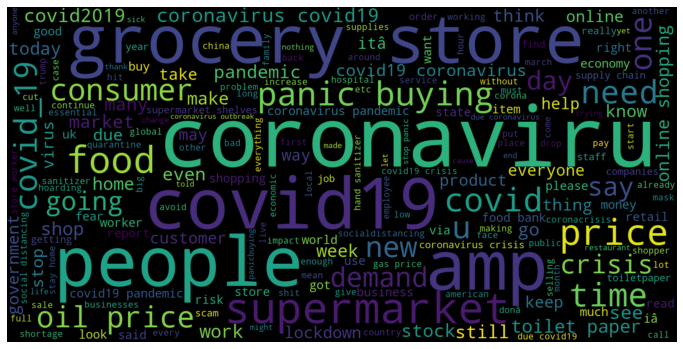

In [ ]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

wordcloud = WordCloud(width=1600, height=800, max_font_size=200).generate(neg_text)
plt.figure(figsize=(12,10))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

Positive Words

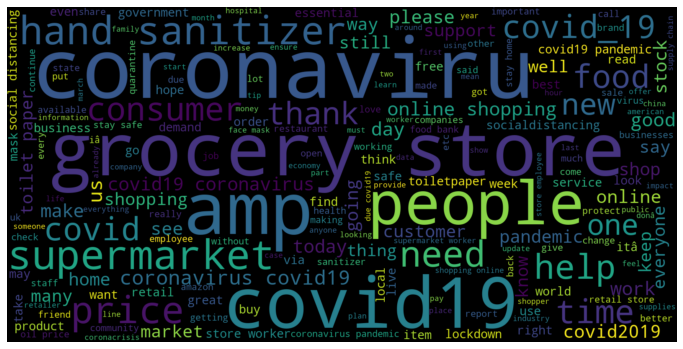

In [ ]:
wordcloud = WordCloud(width=1600, height=800, max_font_size=200).generate(pos_text)
plt.figure(figsize=(12,10))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

Neutral Words

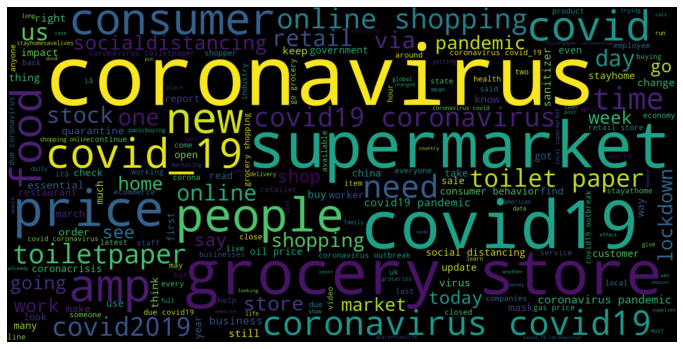

In [ ]:
wordcloud = WordCloud(width=1600, height=800, max_font_size=200).generate(neut_text)
plt.figure(figsize=(12,10))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

### Train and Test Data

In [ ]:
# Separating label and features
train_features = df2.drop('NewSentiment', axis=1).values
class_train = df2['NewSentiment'].values

test_features = df3.drop('NewSentiment', axis=1).values
class_test = df3['NewSentiment'].values

In [ ]:
train_features

array([['@menyrbie @phil_gahan @chrisitv'],
       ['advice talk neighbours family exchange phone numbers create contact list phone numbers neighbours schools employer chemist gp set online shopping accounts poss adequate supplies regular meds order'],
       ['coronavirus australia woolworths give elderly disabled dedicated shopping hours amid covid19 outbreak'],
       ...,
       ['know itâ\x92s getting tough @kameronwilds rationing toilet paper coronavirus toiletpaper @kroger martinsville help us out!!'],
       ['wrong smell hand sanitizer starting turn on? coronavirus covid19 coronavirus'],
       ['@tartiicat well new/used rift going $70000 amazon rn although normal market price usually $40000 prices really crazy right vr headsets since hl alex announced worse covid19 whethe']],
      dtype=object)

### CountVectorizer

In [ ]:
#CountVectorizer is responsible for vectorize text data e transform them into frequency matrix.
#Bag of Words and TF-IDF are techniques to convert text sentences into numerical vectors.

#Bag of Words form
from sklearn.feature_extraction.text import CountVectorizer

# Creation of the matrix
cv = CountVectorizer(max_features=3000) #initial: 1000
cv_train_features = cv.fit_transform(train_features.ravel())
cv_test_features = cv.transform(test_features.ravel())

print('Shape train features:', cv_train_features.shape, ' Shape test features:', cv_test_features.shape)

Shape das features de treino: (41157, 3000)  Shape das features de teste: (3798, 3000)


### Auxiliar Functions

In [ ]:
from sklearn import metrics

def train_predict_model(classifier, 
                        train_features, train_labels, 
                        test_features, test_labels):
    classifier.fit(train_features, train_labels)
    predictions = classifier.predict(test_features) 
    return predictions

In [ ]:
def display_confusion_matrix(true_labels, predicted_labels, classes=[1,0]):
    
    total_classes = len(classes)
    level_labels = [total_classes*[0], list(range(total_classes))]

    cm = metrics.confusion_matrix(y_true=true_labels, y_pred=predicted_labels, 
                                  labels=classes)

    cm_frame = pd.DataFrame(cm, index=classes, columns=classes,)
    cm_frame.index.name = 'Actual'
    cm_frame.columns.name = 'Predicted'

    print(cm_frame)

def display_classification_report(true_labels, predicted_labels, classes=[1,0]):

    report = metrics.classification_report(y_true=true_labels, 
                                           y_pred=predicted_labels, 
                                           labels=classes) 
    print(report)

def display_model_performance_metrics(true_labels, predicted_labels, classes=[1,0]):
    print('Model Performance metrics:')
    print('-'*30)
    get_metrics(true_labels=true_labels, predicted_labels=predicted_labels)
    print('\nModel Classification report:')
    print('-'*30)
    display_classification_report(true_labels=true_labels, predicted_labels=predicted_labels, 
                                  classes=classes)
    print('\nPrediction Confusion Matrix:')
    print('-'*30)
    display_confusion_matrix(true_labels=true_labels, predicted_labels=predicted_labels, 
                             classes=classes)
    
def get_metrics(true_labels, predicted_labels):
    
    print('Accuracy:', np.round(
                        metrics.accuracy_score(true_labels, 
                                               predicted_labels),
                        4))
    print('Precision:', np.round(
                        metrics.precision_score(true_labels, 
                                               predicted_labels,
                                               average='weighted'),
                        4))
    print('Recall:', np.round(
                        metrics.recall_score(true_labels, 
                                               predicted_labels,
                                               average='weighted'),
                        4))
    print('F1 Score:', np.round(
                        metrics.f1_score(true_labels, 
                                               predicted_labels,
                                               average='weighted'),
                        4))


### Random Forest

Bag of Words

In [ ]:
from sklearn.ensemble import RandomForestClassifier
import numpy as np

rfc = RandomForestClassifier(n_jobs=-1)

rfc_bagofwords_predictions = train_predict_model(classifier=rfc, 
                                                train_features=cv_train_features, train_labels=class_train,
                                                test_features=cv_test_features, test_labels=class_test)

display_model_performance_metrics(true_labels=class_test, predicted_labels=rfc_bagofwords_predictions,classes=['Negative', 'Positive', 'Neutral'])

Model Performance metrics:
------------------------------
Accuracy: 0.7291
Precision: 0.7299
Recall: 0.7291
F1 Score: 0.7292

Model Classification report:
------------------------------
              precision    recall  f1-score   support

    Negative       0.75      0.71      0.73      1633
    Positive       0.75      0.77      0.76      1546
     Neutral       0.64      0.67      0.65       619

    accuracy                           0.73      3798
   macro avg       0.71      0.72      0.71      3798
weighted avg       0.73      0.73      0.73      3798


Prediction Confusion Matrix:
------------------------------
Predicted  Negative  Positive  Neutral
Actual                                
Negative       1162       325      146
Positive        263      1193       90
Neutral         130        75      414


TF-IDF

In [ ]:
#TF-IDF vector form
from sklearn.feature_extraction.text import  TfidfVectorizer

tv = TfidfVectorizer(min_df=0.0, max_df=1.0, max_features=3000, ngram_range=(1,2),
                     sublinear_tf=True)
tv_train_features = tv.fit_transform(train_features.ravel())
tv_test_features = tv.transform(test_features.ravel())

print('Shape train features:', tv_train_features.shape, ' Shape test features:', tv_test_features.shape, '\n')

rfc_tfidf_predictions = train_predict_model(classifier=rfc, 
                                               train_features=tv_train_features, train_labels=class_train,
                                               test_features=tv_test_features, test_labels=class_test)
display_model_performance_metrics(true_labels=class_test, predicted_labels=rfc_tfidf_predictions,classes=['Negative', 'Positive', 'Neutral'])

Shape das features de treino: (41157, 3000)  Shape das features de teste: (3798, 3000) 

Model Performance metrics:
------------------------------
Accuracy: 0.698
Precision: 0.6998
Recall: 0.698
F1 Score: 0.6987

Model Classification report:
------------------------------
              precision    recall  f1-score   support

    Negative       0.72      0.70      0.71      1633
    Positive       0.73      0.74      0.74      1546
     Neutral       0.56      0.60      0.58       619

    accuracy                           0.70      3798
   macro avg       0.67      0.68      0.67      3798
weighted avg       0.70      0.70      0.70      3798


Prediction Confusion Matrix:
------------------------------
Predicted  Negative  Positive  Neutral
Actual                                
Negative       1136       328      169
Positive        279      1145      122
Neutral         153        96      370
